# What's affecting Seattle home prices?
$\qquad\qquad\qquad\qquad$ by room2  (Jingyue W,Jihang J, Huixin L, Jinglai Z  )

![jupyter](./house.png)

## data preprocessing

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pylab as plt
import seaborn as sns
import folium
from sklearn.model_selection import train_test_split

In [2]:
df = pd.read_csv('home_data.csv') 
df.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,20141013T000000,221900,3,1.00,1180,5650,1.0,0,0,...,7,1180,0,1955,0,98178,47.5112,-122.257,1340,5650
1,6414100192,20141209T000000,538000,3,2.25,2570,7242,2.0,0,0,...,7,2170,400,1951,1991,98125,47.7210,-122.319,1690,7639
2,5631500400,20150225T000000,180000,2,1.00,770,10000,1.0,0,0,...,6,770,0,1933,0,98028,47.7379,-122.233,2720,8062
3,2487200875,20141209T000000,604000,4,3.00,1960,5000,1.0,0,0,...,7,1050,910,1965,0,98136,47.5208,-122.393,1360,5000
4,1954400510,20150218T000000,510000,3,2.00,1680,8080,1.0,0,0,...,8,1680,0,1987,0,98074,47.6168,-122.045,1800,7503


In [3]:
print(len(df['id'].unique()))
print(df.shape[0])

21436
21613


In [32]:
basic_features = ['bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot', 'floors', 'zipcode']
advanced_features = basic_features + [
    'condition',      # condition of the house
    'grade',          # measure of qality of construction
    'waterfront',     # waterfront property 
    'view',           # type of view
    'sqft_above',     # square feet above ground
    'sqft_basement',  # square feet in basementab
    'yr_built',       # the year built
    'yr_renovated',   # the year renovated
    'lat',            # the longitude of the parcel
    'long',           # the latitide of the parcel
    'sqft_living15',  # average sq.ft. of 15 nearest neighbors 
    'sqft_lot15',     # average lot size of 15 nearest neighbors 
]

In [4]:
df=df.groupby('id').mean()

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 21436 entries, 1000102 to 9900000190
Data columns (total 19 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   price          21436 non-null  float64
 1   bedrooms       21436 non-null  float64
 2   bathrooms      21436 non-null  float64
 3   sqft_living    21436 non-null  float64
 4   sqft_lot       21436 non-null  float64
 5   floors         21436 non-null  float64
 6   waterfront     21436 non-null  float64
 7   view           21436 non-null  float64
 8   condition      21436 non-null  float64
 9   grade          21436 non-null  float64
 10  sqft_above     21436 non-null  float64
 11  sqft_basement  21436 non-null  float64
 12  yr_built       21436 non-null  float64
 13  yr_renovated   21436 non-null  float64
 14  zipcode        21436 non-null  float64
 15  lat            21436 non-null  float64
 16  long           21436 non-null  float64
 17  sqft_living15  21436 non-null  float64


In [29]:
df.describe()

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
count,2.143500e+04,21435.000000,21435.000000,21435.000000,2.143500e+04,21435.000000,21435.000000,21435.000000,21435.00000,21435.000000,21435.000000,21435.000000,21435.000000,21435.000000,21435.000000,21435.000000,21435.000000,21435.000000,21435.000000
mean,5.410848e+05,3.370189,2.117366,2082.726522,1.513606e+04,1.496221,0.007604,0.235129,3.41031,7.661768,1790.995475,291.731047,1971.099557,84.733753,98077.861115,47.560150,-122.213692,1988.345090,12786.338512
std,3.674307e+05,0.906920,0.769927,919.162476,4.153954e+04,0.540390,0.086873,0.767108,0.65016,1.174275,829.029961,442.787935,29.385501,402.439983,53.470342,0.138602,0.140897,685.700345,27376.050345
min,7.500000e+04,0.000000,0.000000,290.000000,5.200000e+02,1.000000,0.000000,0.000000,1.00000,1.000000,290.000000,0.000000,1900.000000,0.000000,98001.000000,47.155900,-122.519000,399.000000,651.000000
25%,3.232000e+05,3.000000,1.750000,1430.000000,5.040000e+03,1.000000,0.000000,0.000000,3.00000,7.000000,1200.000000,0.000000,1952.000000,0.000000,98033.000000,47.471100,-122.328000,1490.000000,5100.000000
50%,4.500000e+05,3.000000,2.250000,1920.000000,7.614000e+03,1.500000,0.000000,0.000000,3.00000,7.000000,1560.000000,0.000000,1975.000000,0.000000,98065.000000,47.572000,-122.230000,1840.000000,7620.000000
75%,6.450000e+05,4.000000,2.500000,2550.000000,1.069650e+04,2.000000,0.000000,0.000000,4.00000,8.000000,2220.000000,560.000000,1997.000000,0.000000,98117.000000,47.678000,-122.124000,2370.000000,10087.500000
max,7.700000e+06,11.000000,8.000000,13540.000000,1.651359e+06,3.500000,1.000000,4.000000,5.00000,13.000000,9410.000000,4820.000000,2015.000000,2015.000000,98199.000000,47.777600,-121.315000,6210.000000,871200.000000


D:\work\develop\anaconda\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
D:\work\develop\anaconda\lib\site-packages\seaborn\distributions.py:2103: FutureWarning: The `axis` variable is no longer used and will be removed. Instead, assign variables directly to `x` or `y`.
  warnings.warn(msg, FutureWarning)


Text(0.5, 1.0, 'distribution of price')

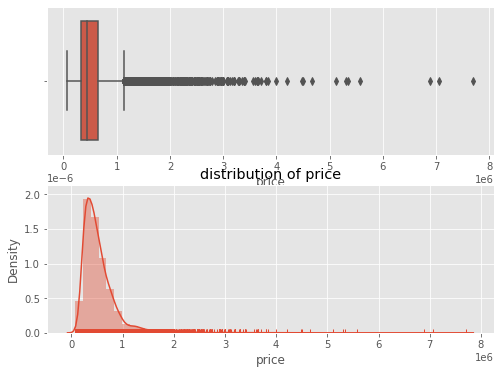

In [28]:
plt.style.use('ggplot')

plt.figure(figsize=(8, 6))
plt.subplot(2,1,1) 
sns.boxplot(x=df['price'])
plt.subplot(2,1,2) 
sns.distplot(df['price'], bins=50,hist = True, kde = True, rug = True)
plt.title('distribution of price')

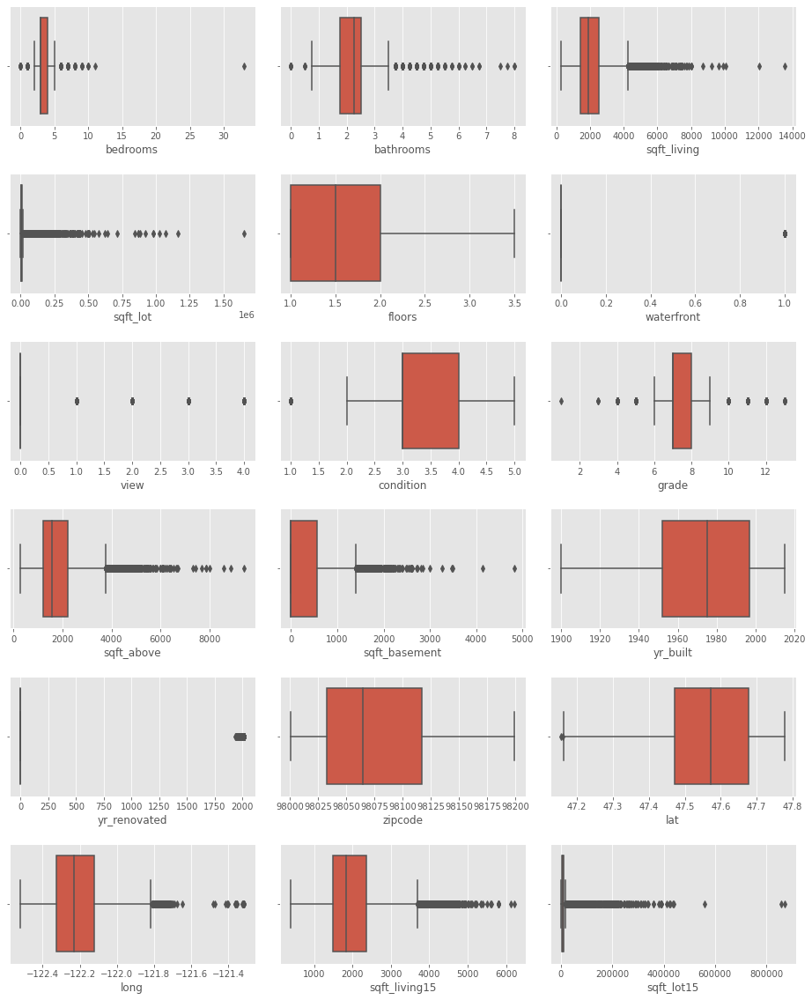

In [8]:
plt.figure(figsize=(16, 20))
plt.subplots_adjust(wspace =0.1, hspace =0.4)
for index in range(1,19):
    plt.subplot(6,3,index) 
    sns.boxplot(x=df[df.columns[index]])



In [9]:
display(df['bedrooms'].unique())
display(df[df['bedrooms']==33])
df=df[df['bedrooms']!=33]

array([ 6.,  4.,  3.,  5.,  2.,  1.,  7.,  9., 10.,  8.,  0., 11., 33.])

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
id,,,,,,,,,,,,,,,,,,,
2402100895,640000.0,33.0,1.75,1620.0,6000.0,1.0,0.0,0.0,5.0,7.0,1040.0,580.0,1947.0,0.0,98103.0,47.6878,-122.331,1330.0,4700.0


In [10]:
display(df[df['sqft_lot15']>800000])

df=df[df['bedrooms']<800000]

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
id,,,,,,,,,,,,,,,,,,,
225079036,937500.0,4.0,4.0,5545.0,871200.0,2.0,0.0,0.0,3.0,11.0,3605.0,1940.0,2003.0,0.0,98014.0,47.676,-121.882,3420.0,871200.0
1125079111,1600000.0,4.0,5.5,6530.0,871200.0,2.0,0.0,2.0,3.0,11.0,6530.0,0.0,2008.0,0.0,98014.0,47.664,-121.878,1280.0,858132.0


In [11]:
#(74999.999, 323200.0] < (323200.0, 450000.0] < (450000.0, 645000.0] < (645000.0, 7700000.0]

bin_num=4
df['binning'] = pd.qcut(df['price'],bin_num,labels=[1, 2,3,4 ]) 
df['binning_interval'] = pd.qcut(df['price'],bin_num)
df[['binning','binning_interval']].head()

,binning,binning_interval
id,,
1000102,1,"(74999.999, 323200.0]"
1200019,4,"(645000.0, 7700000.0]"
1200021,2,"(323200.0, 450000.0]"
2800031,1,"(74999.999, 323200.0]"
3600057,2,"(323200.0, 450000.0]"


## data description

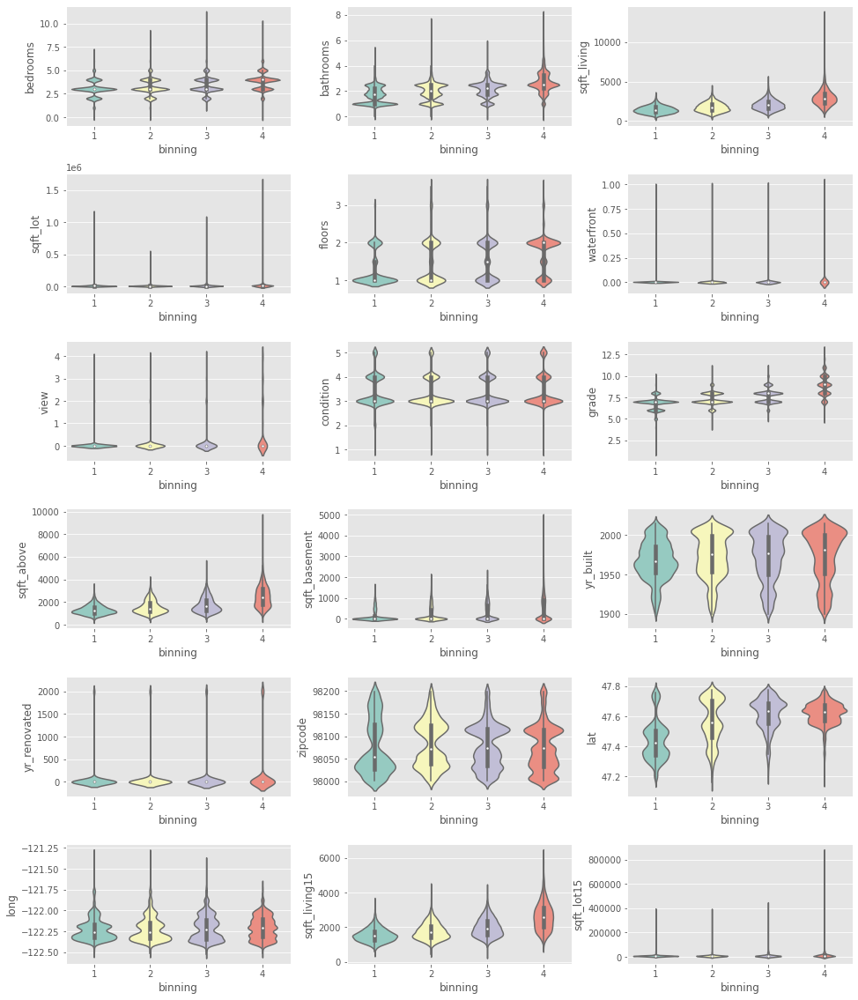

In [12]:
plt.figure(figsize=(16, 20))
plt.subplots_adjust(wspace =0.25, hspace =0.4)
for index in range(1,19):
    plt.subplot(6,3,index) 
    sns.violinplot(x="binning", y=df[df.columns[index]],data=df, palette="Set3")

In [20]:
sales_map = df[['lat','long','price']]
sales_map.describe()

,lat,long,price
count,21435.000000,21435.000000,2.143500e+04
mean,47.560150,-122.213692,5.410848e+05
std,0.138602,0.140897,3.674307e+05
min,47.155900,-122.519000,7.500000e+04
25%,47.471100,-122.328000,3.232000e+05
50%,47.572000,-122.230000,4.500000e+05
75%,47.678000,-122.124000,6.450000e+05
max,47.777600,-121.315000,7.700000e+06


In [22]:
import folium
from folium.plugins import HeatMap
from folium.plugins import CirclePattern

import webbrowser



map = folium.Map(location=[47,-122],zoom_start=10)
HeatMap(sales_map,
       name='price tag',
       min_opacity=1000,
       max_val=1,
       radius=10,
       blur=15,
       ).add_to(map)
file_path = r"D:\work\pre work\pic.html"
map.save(file_path)
webbrowser.open(file_path)
map

C:\Users\WuJingyue\AppData\Local\Temp\ipykernel_3176\44317859.py:10: UserWarning: The `max_val` parameter is no longer necessary. The largest intensity is calculated automatically.
  HeatMap(sales_map,


In [26]:
import folium
from folium.plugins import HeatMap
from folium.plugins import CirclePattern

import webbrowser



map2 = folium.Map(location=[47,-122],zoom_start=10,control_scale=True)

for house in sales_map.itertuples():
    folium.Circle(
        location=[house.lat,house.long],
        radius=60,
        color=('red' if house.price>600000 else('green' if house.price>400000 else('yellow' if house.price>300000 else 'blue') )),
        fill=True,
        fill_color=('red' if house.price>600000 else('green' if house.price>400000 else('yellow' if house.price>300000 else 'blue') ))
    ).add_to(map2)

file_path = r"D:\work\pre work\houseMap.html"
map2.save(file_path)
webbrowser.open(file_path)
map2

In [13]:
train_data, val_and_test_data = train_test_split(df, test_size=0.3)
val_data, test_data = train_test_split(val_and_test_data, test_size=0.5) # 50% of 30% is 15%

Text(0, 0.5, 'Price')

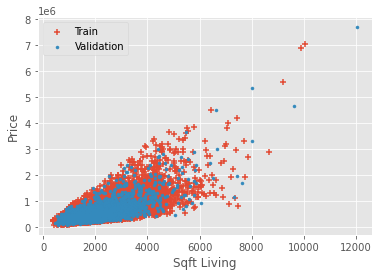

In [14]:
%matplotlib inline

# Plot sqft_living vs housing price for the train and val dataset
plt.scatter(train_data['sqft_living'], train_data['price'], marker='+', label='Train')
plt.scatter(val_data['sqft_living'], val_data['price'], marker='.', label='Validation')

# Code to customize the axis labels
plt.legend()
plt.xlabel('Sqft Living')
plt.ylabel('Price')

This time we will look at using two sets of features derived from the data inputs. The basic set of features only contains a few data inputs, while the advanced features contain the basic features and more.

In [15]:
basic_features = ['bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot', 'floors', 'zipcode']
advanced_features = basic_features + [
    'condition',      # condition of the house
    'grade',          # measure of qality of construction
    'waterfront',     # waterfront property 
    'view',           # type of view
    'sqft_above',     # square feet above ground
    'sqft_basement',  # square feet in basementab
    'yr_built',       # the year built
    'yr_renovated',   # the year renovated
    'lat',            # the longitude of the parcel
    'long',           # the latitide of the parcel
    'sqft_living15',  # average sq.ft. of 15 nearest neighbors 
    'sqft_lot15',     # average lot size of 15 nearest neighbors 
]

In the following cell, we will train two linear regression models
* The first should be saved in a variable called `basic_model` that only uses the basic features
* The second should be saved in a variable called `advanced_model` that uses the advanced features

In [16]:
from sklearn.linear_model import LinearRegression

basic_train_X = train_data[basic_features]
basic_train_Y = train_data["price"]

basic_test_X = test_data[basic_features]
basic_test_Y = test_data["price"]

basic_val_X = val_data[basic_features]
basic_val_Y = val_data["price"]

basic_model = LinearRegression()
basic_model.fit(basic_train_X,basic_train_Y)

advanced_train_X = train_data[advanced_features]
advanced_train_Y = train_data["price"]

advanced_test_X = test_data[advanced_features]
advanced_test_Y = test_data["price"]

advanced_val_X = val_data[advanced_features]
advanced_val_Y = val_data["price"]

advanced_model = LinearRegression()
advanced_model.fit(advanced_train_X,advanced_train_Y)

advanced_val_model = LinearRegression()
advanced_val_model

LinearRegression()

Now, we will evaluate the models' predictions to see how they perform. The RMSE is another commonly reported metric used for regression models. The RMSE is similar to MSE but is modified slightly to scale the number down. The RMSE is defined as $$RMSE = \sqrt{MSE}$$ 
So we will evaluate the model's predictions by calculating its RMSE


In [17]:
from sklearn.metrics import mean_squared_error

# TODO
def rmse(model, X, y):
    predictions = model.predict(X)
    return mean_squared_error(predictions, y, squared=False)



rmse_basic = rmse(basic_model, basic_val_X, basic_val_Y)
rmse_advanced = rmse(advanced_model, advanced_val_X, advanced_val_Y)
rmse_advanced

219261.0536010318

Now we will try to predict them by using another model, decision tree. We category different level of price by calculating the logrithm of their price with 1.25 

In [18]:
train_level = np.floor(np.log(advanced_train_Y/75000)/np.log(1.25))
val_level = np.floor(np.log(advanced_val_Y/75000)/np.log(1.25))
print(train_level.dtype)
def find_accuracy(X, y, model):
    y_hat = model.predict(X)
    diff = y_hat - y
    df = diff.value_counts()
    return df[0]/len(diff)
from sklearn.tree import DecisionTreeClassifier
for i in range(1, 20):
    clf = DecisionTreeClassifier(max_depth=i)
    clf.fit(advanced_train_X, train_level)
    decision_tree_model = clf
    decision_train_accuracy = find_accuracy(advanced_train_X, train_level, decision_tree_model)
    decision_validation_accuracy = find_accuracy(advanced_val_X, val_level, decision_tree_model)
    print(decision_train_accuracy, decision_validation_accuracy)



float64
0.2258731005065316 0.22363919129082427
0.2920554518794988 0.28584758942457233
0.3410423886963476 0.3343701399688958
0.37056784857371367 0.3729393468118196
0.41302319381498265 0.40870917573872473
0.4511463609704079 0.42208398133748054
0.4896694214876033 0.44043545878693624
0.5291255665155958 0.4423017107309487
0.5723140495867769 0.45909797822706067
0.6222340709144228 0.4547433903576983
0.6792188749666755 0.45194401244167964
0.7370701146360971 0.4488335925349922
0.7889229538789656 0.4432348367029549
0.8326446280991735 0.4413685847589425
0.8735670487869901 0.4401244167962675
0.9072247400693149 0.4379471228615863
0.9321514262863236 0.4329704510108865
0.9517462010130632 0.42892690513219284
0.9669421487603306 0.42954898911353034


We can find that when max-depth is 10, it has best performance. And we can predict the price level with 45% accuracy.

We also draw the graph of decision tree which is showed below.

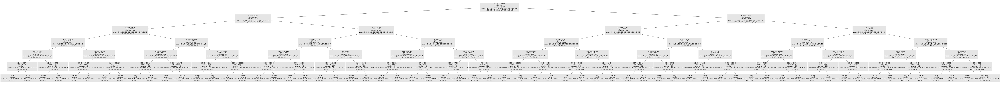

In [19]:
from sklearn.tree import plot_tree
import os
clf = DecisionTreeClassifier(max_depth=6)
clf.fit(advanced_train_X, train_level)
decision_tree_model = clf
fig = plt.figure(figsize=(115,10))
plot_tree(decision_tree_model, fontsize=8)
fig.savefig('tree.png')

# conlution